# Understanding Independence and Why it is Critical in Causal Inference and Causal Validation

## A step-by-step guide in understanding the concept of independence and how to apply it to validate directed acyclic graphs in causal validation using Python

## Background

In a recent article the author explored and explained how the concept of dependence can be used to validate a proposed Directed Acyclic Graph (DAG) against a dataset to identify spurious edges in the graph i.e. causal links suggested by the DAG that do not exist in the data.

In this second instalment the opposite (but equally critical) concept will be applied i.e. how to use independence to identify missing esges. These are causal links that do not appear in the proposed DAG but do actually exist in the data that must be added back into the DAG to make it complete and correct.

# Introduction

Causal Inference is an emergent branch of data science concerned with determining the cause-and-effect relationship between events and outcomes and it has the potential to significantly add to the value that machine learning can generate for organisations.

For example, a traditional machine learning algorithm can predict which loan customers are likely to default thereby enabling proactive intervention with customers. However, although this algorithm will be useful to reduce loan defaults, it will have no concept of why they occurred and whilst pro-active intervention is useful knowing the reasons for defaults would enable the underlying cause to be addressed. In this world pro-active intervention may no longer be necessary because the factors that lead to defaulting have been permanently cured.

This is the promise of Causal Inference and why it has the potential to deliver significant impact and outcomes to those organisations that can harness that potential.

There are a number of different approaches but the most common approach typically starts by augmenting the data with a "Directed Acyclic Graph" which encapsulates and visualises the causal relationships in the data and then uses causal inference techniques to ask "what-if" type questions.

### The Problem
A Directed Acyclic Graph (DAG) that encapsulates the causal relationships in the data is typically constructed manually (or semi-manually) by data scientists and domain experts working together. Hence the DAG could be wrong which would invalidate any causal calculations leading to flawed conclusions and potentially incorrect decisions.

### The Opportunity
A range of techniques exist for "Causal Validation" (the process of validating the DAG against the data) and if these techniques work they can minimise or elliminate errors in the DAG thereby ensuring that the calculations and conclusions are error-free.

### The Way Forward
The statistical concept of independence between random variables can be used to ascertain whether a relationship that does not exist in the DAG does exist in the data. If this situation is encountered it is likely that the causal relationship that is missing in the DAG needs to be added to it to make it complete and correct.

In [3]:
import pandas as pd
import numpy as np
import copy

from typing import Tuple

import matplotlib.pyplot as plt

from icecream import ic
#import pickle

from statsmodels.formula.api import ols
from statsmodels.regression.linear_model import RegressionResultsWrapper


In [4]:
import sys
sys.path.insert(1, r'C:\\Users\\GHarr\\OneDrive - Lincoln College\\Python Projects\Data Science\\ghlibrary')

import dataframe_tools
from dag_tools import DirectedAcyclicGraph
from causal_tools import CausalModel

## Getting Started

We are going to need an example DAG to work through the problem which has enough nodes and links to provide a good example with which to explore the problem ...

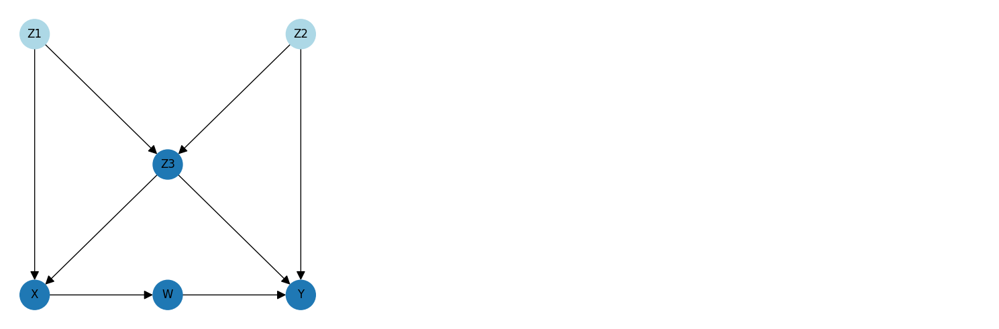

In [5]:
example_dag = DirectedAcyclicGraph.example_dags()["causal_inference_in_statistics_1"]
#print(example_dag["description"])

dag: DirectedAcyclicGraph = example_dag["dag"]
dag.draw(grid_size=3)

The DAG is entirely fictitious so the letters on the nodes do not have any meaning, but to note that "X" is the treatment, "Y" is the outcome and the other nodes are represent factors that are affecting the outcome with the potential to hide or skew the true effect of X on Y.

To better understand the DAG if it were representing a real-world problem it could represent the following ...

- X represents the regulatiry with which a drug is taken.
- W represents the effect of the drug on blood pressure.
- Y represents the improvement on patient recovery and outcome.
- Z1, Z2, and Z3 represent other factors (for example maybe Z1 represents healthy lifestyle and Z3 represents fitness level)

The arrows in a DAG then represent the causal effect of one factor on another, for example ...

- Taking the drug (represented by "X") has a causal effect on blood pressure (represented by "W") which in turn has a causal effect on patient recovery ("Y").

We will also need some data that matches the DAG. The dataset below is entirely synthetic and has been generated by the author; it exactly encapsulates and matches the structure suggested by the DAG and contains no erroneous or faulty relationships ...

In [6]:
causal_model = CausalModel(dag=dag, random_state=42)
causal_model.fit(X = None)

causal_model.data

ic| 'CausalModel.fit'
ic| expr_str: 'Z3 = -1.5 x Z1 + -1.5 x Z2 + ε'
ic| expr_str: 'X = -1.5 x Z1 + 1.5 x Z3 + ε'
ic| expr_str: 'W = -3 x X + ε'
ic| expr_str: 'Y = -2.5 x W + -3 x Z2 + -3 x Z3 + ε'


,Z1,Z2,Z3,X,W,Y
0,5.634316,1.399732,-9.457510,-21.728642,64.545328,-120.620102
1,7.341857,0.031668,-9.185323,-25.465542,66.171944,-154.718851
2,3.914095,2.636184,-10.539252,-20.263286,55.917173,-121.249133
3,3.914127,2.046147,-8.605228,-17.126338,50.566902,-99.430348
4,7.451454,3.017559,-16.175601,-38.717383,111.570094,-240.292790
...,...,...,...,...,...,...
995,5.620962,-0.423221,-7.355114,-19.110789,55.184392,-121.142839
996,3.256654,0.968543,-6.147635,-11.636578,54.227708,-120.336222
997,5.487806,-0.158014,-7.729270,-22.333141,71.014581,-142.812483
998,7.100604,-0.023013,-9.731935,-27.391360,77.888786,-145.384525


The next sections will begin to unpack the DAG and the data and use them to explain how statistical independence can be used to identify causal links that have been missed or omitted from the DAG.

## Understanding Independence

One definition of independence is as follows - "Independence between two random variables refers to a fundamental concept where the occurrence or value of one random variable does not influence or provide any information about the occurrence or value of the other random variable".

Let's take another look at our DAG and consider nodes Z1 and Z2 ...

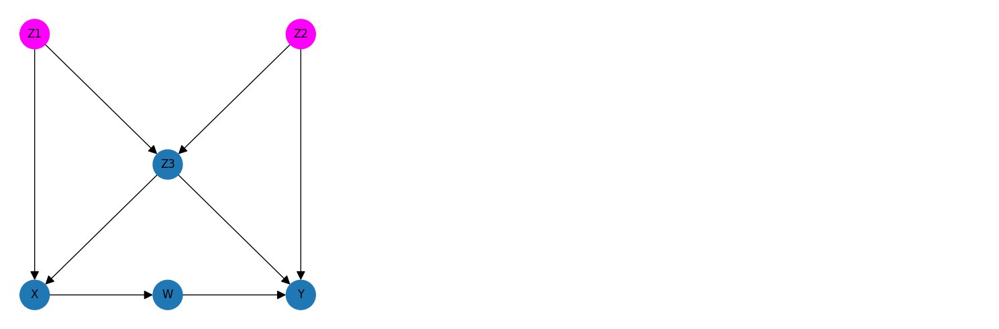

In [7]:
nodesets: list = [["Z1", "Z2"]]
dag.draw_nodesets(nodesets=nodesets, cols=3)

We can see that nodes Z1 and Z2 (representing some causal factors affecting the treatment and outcome) have no direct or indiirect connection and their are no paths through the DAG that link them so Z1 can be said to be independent of Z2 (and vice versa).

To illustrate the point further we can also see that although X (the treatment) and Y (the outcome) are not directly connected they are in fact dependent because there are several paths through the DAG that connect them ...

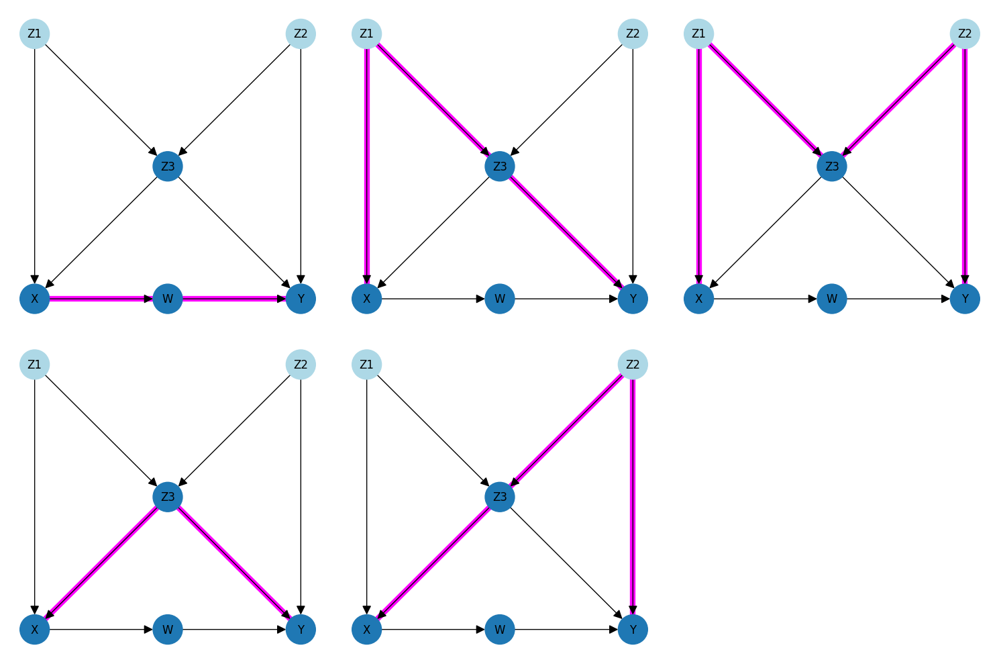

1) X -> W -> Y
2) X <- Z1 -> Z3 -> Y
3) X <- Z1 -> Z3 <- Z2 -> Y
4) X <- Z3 -> Y
5) X <- Z3 <- Z2 -> Y


In [8]:
dag.draw_paths(paths=dag.all_paths(), cols=3, print_paths=True)

What these two examples show is that if the value if Z1 changes it will not influence or change the value of Z2 but if the value of X changes it will change the value of Y.

This explanation can be expanded by taking a look at the dataset that the DAG is modelling ...

In [9]:
causal_model.data

,Z1,Z2,Z3,X,W,Y
0,5.634316,1.399732,-9.457510,-21.728642,64.545328,-120.620102
1,7.341857,0.031668,-9.185323,-25.465542,66.171944,-154.718851
2,3.914095,2.636184,-10.539252,-20.263286,55.917173,-121.249133
3,3.914127,2.046147,-8.605228,-17.126338,50.566902,-99.430348
4,7.451454,3.017559,-16.175601,-38.717383,111.570094,-240.292790
...,...,...,...,...,...,...
995,5.620962,-0.423221,-7.355114,-19.110789,55.184392,-121.142839
996,3.256654,0.968543,-6.147635,-11.636578,54.227708,-120.336222
997,5.487806,-0.158014,-7.729270,-22.333141,71.014581,-142.812483
998,7.100604,-0.023013,-9.731935,-27.391360,77.888786,-145.384525


In a real-world causal inference problem the data would be the starting point and the DAG would be developed by consulting with the domain experts but to facilitate the article the author needed a dataset that was guaranteed to match the DAG. Hence the dataset above was generated by applying the following formulae to create 1000 rows of data ...

In [10]:
causal_model.structural_equations

{'Z1': 'Z1 = np.random.normal(4.370861069626263, 1.9507143064099162)',
 'Z2': 'Z2 = np.random.normal(1.2842753034307783, 1.9362122462436897)',
 'Z3': 'Z3 = -1.5 x Z1 + -1.5 x Z2 + ε',
 'X': 'X = -1.5 x Z1 + 1.5 x Z3 + ε',
 'W': 'W = -3 x X + ε',
 'Y': 'Y = -2.5 x W + -3 x Z2 + -3 x Z3 + ε'}

$$
Z1 \sim \mathcal{N}(4.37, 1.95^2) \\
Z2 \sim \mathcal{N}(1.28, 1.94^2) \\ 
$$

$$
Z3 = -1.5Z1 -1.5Z2 + ε \\
X = -1.5Z1 + 1.5Z3 + ε \\
W = -3X + ε \\
Y = -2.5W -3Z2 -3Z3 + ε
$$

This can be read and understood as follows -

- Z1 is an exogenous variable (i.e. it has no inputs) that is normally distributed with a mean of 4.37 and a standard deviation of 1.95
- Z1 is an exogenous variable that is normally distributed with a mean of 1.28 and a standard deviation of 1.94
- Z3 = -1.5 X Z1 - 1.5 x Z2 + an error term
- X = -1.5 x Z1 + 1.5 x Z3 + an error term
- W = -3 x XZ + an error term
- Y = -2.5 x W + -3 x Z2 + -3 x Z3 + an error term

The formulae that were used to create the data clearly show that Z1 is independent of Z2 because they are both completely separate normal distributions but that X and Y are not independent because changing X will change W and changing W will change Y.

There is yet another way of representing this, by using mathematical notation to show the dependence ...

$$
% \perp is the ⊥ symbol, \!\!\! reverses 3 intervals and overlays another ⊥ giving ⫫
% \perp is ⊥ symbol then \!\!\!\!\!\! reverses 6 intervals, / is a sepeartor and finaly \ adds the slash giving ⫫̸
\providecommand{\independent}{\perp \!\!\! \perp}
\providecommand{\dependent}{\independent \!\!\!\!\!\! / \ }
\providecommand{\independentsingle}{\perp}
\providecommand{\dependentsingle}{\perp \!\!\!\!\!\! / \ }
\providecommand{\given}{\mid}
$$

$$
Z1 \independent Z2
$$

$$
Y \dependent X
$$

The ⫫ symbol is called a "double up-tack" and means "is independent of". The ⫫̸ symbol does not have a widely accepted name so I have adopted "slashed double up-tack" through personal preference and means "is dependent on" so the formulae above read as Z1 is independent of Z2 and spearately Y is dependent on X.

In concluding this section we will bring this knowledge back to its importance in the context of causal validation.

In a causal inference problem the data will have been collected and the DAG will have been constructed separately, usually by consulting domain experts who coould potentially have made mistakes or whose knowledge could have been incomplete. Causal validation then is the process of proving or disproving that the DAG is a valid causal representation of the data.

Independence has a critical role to play in this process because if the dependencies and independencis represented on the DAG can all be matched and detected in the data then it can be inferred that the DAG is valid.

This can be represented using the following formulae ..

$$
Z1 \independent _{_{G}} \ Z2 \Rightarrow Z \independent _{_{D}} \ Z2
$$

$$
Y \dependent _{_{G}} \ X \Rightarrow Y \dependent _{_{D}} \ X
$$

These formulae look scary but are actually very straightforward. The first says that if Z1 is independent of Z2 in the graph (DAG) then Z1 should also be independent of Z2 in the data and the second says that if Y is dependent on X in the graph (DAG) then Y should also be dependent on Y in the data.

## Using Independence to Identify Missing Links

In a previous article I explained how independence can be used to detect spurious links i.e. causal relationships that appear in the DAG that do not appear in the data and in the remainder of this article I will explore how dependence can be used to identify missing links i.e. causal relationships that do not appear in the DAG that do appear in the data.

It follows that if missing links can be identified using independence they can then be added back into an invalid DAG to make it valid.

The approach proposed in this article has its basis in the many works and published papers of Judea Pearl who is recognised as a global authority on causal inference. In "Causal Inference in Statistics" (Pearl, Glymour, Jewell, 2019) Pearl explores the idea of using d-separation to identify missing links but it is a partial example and does not provide enough explanation to implement an algorithm in Python.

The exploration below starts with the approach proposed by Pearl and develops it significantly such that a solution can be implemented in Python that will reliably identifiy missing links in any DAG i.e. causal relationships that exist in the data that have not been accurately captured and represented in the DAG.

There are many partial attempts at this method across many books, online articles and academic papers but it can all be boiled down to the following ...

"Within a DAG any node N should be independent of its non-descendants given its parents" (authors own words and explanation)

That sounds complicated and it is difficult to understand in isolation but with examples it can be made clearer.

Every node in the DAG can be tested separately againt that rule. Here is the rule applied to node "W" ...

$$
W \independent \ non{-}descendants \given parents
$$

... which can be read as - "W is independent of its non-descendants given (when conditioned on) its parents".

So what does this mean and how can it be applied to identify missing causal relationships in the DAG?

To start with we will need to fully understand what is meant by "parents" and what is meant by "non-descendents". 

To note: the following diagrams are coloured-coded as follows ...

- Pink: The node of interest
- Red: Parents
- Green: Descendants
- Yellow: Non-descendants
- Blue: All other nodes

In [11]:
BRIGHT_PINK: str = "#ff00ff"
DARK_BLUE: str = "#1f78b4"
LIGHT_GREEN: str = "lightgreen"
LIGHT_BLUE: str = "lightblue"

The parents of a node are easy to visualise; they are the nodes in the DAG that have a causal link with an arrow pointing into that node and we can visualise that by considering the charts representing the parents of node W and separately the parents of node X ...

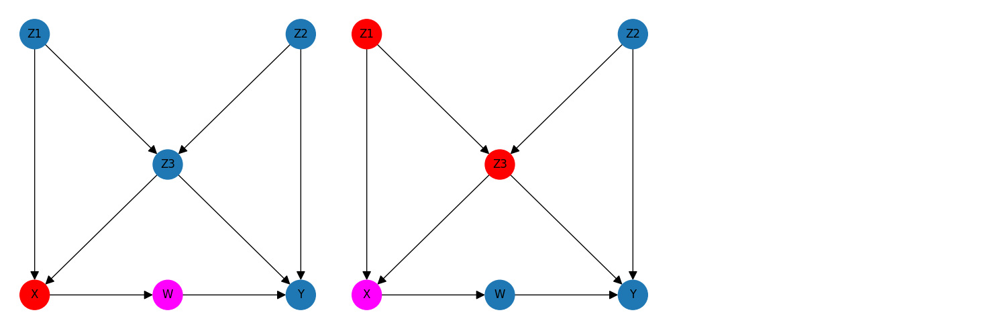

In [12]:
ax_lst = dag._create_grid(item_count=2 , figsize=(5,5), cols=3)

node_of_insterest="W"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in dag.parents(node_of_insterest) else "green" if node in [] else DARK_BLUE for node in dag.nodes]
dag.draw(node_colors=node_colors, ax=ax_lst[0])

node_of_insterest="X"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in dag.parents(node_of_insterest) else "green" if node in [] else DARK_BLUE for node in dag.nodes]
dag.draw(node_colors=node_colors, ax=ax_lst[1])


We can see that node W has a single parent - X and node X has two parents - Z1 and Z3 and we can also see that different nodes can have zero, 1 or more parents.

Non-descendants are slightly harder to visualise as they are subtly different from ancestors. My definition of non-descendants of a node is as follows ...

"Non-descendants of a node are all nodes that are not descendants and also not direct parents"

To illustrate this, let's first visualise all of the descendants of node W, and separately node X ...

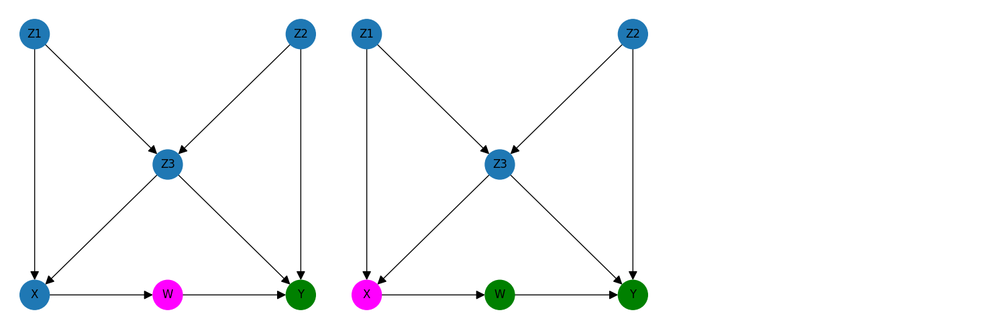

In [13]:
ax_lst = dag._create_grid(item_count=2 , figsize=(5,5), cols=3)

node_of_insterest="W"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in [] else "green" if node in dag.descendants(node_of_insterest) else DARK_BLUE for node in dag.nodes]
dag.draw(node_colors=node_colors, ax=ax_lst[0])

node_of_insterest="X"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in [] else "green" if node in dag.descendants(node_of_insterest) else DARK_BLUE for node in dag.nodes]
dag.draw(node_colors=node_colors, ax=ax_lst[1])

We can see that W has a single descendant - Y, but that X has two descendants - W and Y i.e. descendants are a nodes direct children, grand-children, great grand-children etc.

We are now ready to visualise the non-descendants for a given node which are simply all of the nodes excluding descendants and excluding direct parents. Here they are for nodes W and X ...

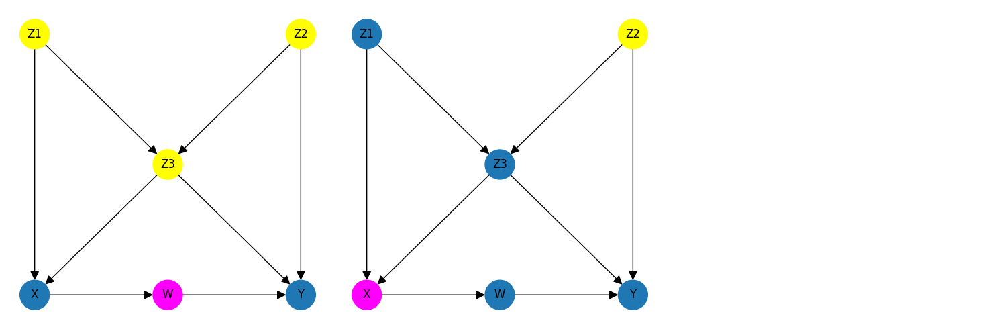

In [14]:
ax_lst = dag._create_grid(item_count=2 , figsize=(5,5), cols=3)

node_of_insterest="W"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in [] else "yellow" if node in dag.non_descendants(node_of_insterest) else DARK_BLUE for node in dag.nodes]
dag.draw(node_colors=node_colors, ax=ax_lst[0])

node_of_insterest="X"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in [] else "yellow" if node in dag.non_descendants(node_of_insterest) else DARK_BLUE for node in dag.nodes]
dag.draw(node_colors=node_colors, ax=ax_lst[1])

And finally, here it is all together - a diagrams for node W and a separate diagram for node X that highlights their parents in red and their non-descendants in yellow ...

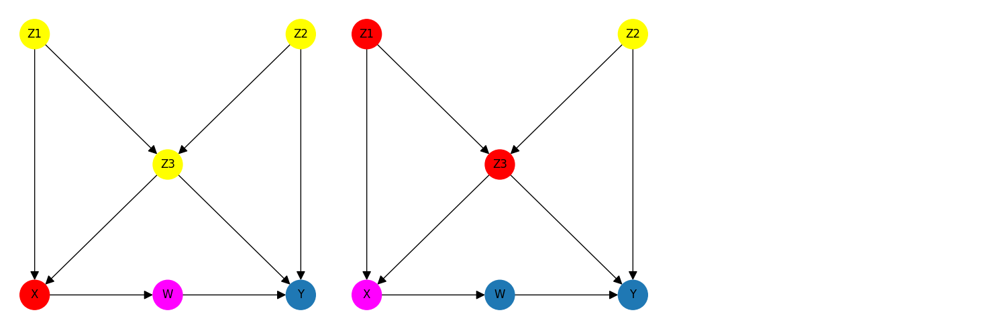

In [15]:
ax_lst = dag._create_grid(item_count=2 , figsize=(5,5), cols=3)

node_of_insterest="W"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in dag.parents(node_of_insterest) else "yellow" if node in dag.non_descendants(node_of_insterest) else DARK_BLUE for node in dag.nodes]
dag.draw(node_colors=node_colors, ax=ax_lst[0])

node_of_insterest="X"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in dag.parents(node_of_insterest) else "yellow" if node in dag.non_descendants(node_of_insterest) else DARK_BLUE for node in dag.nodes]
dag.draw(node_colors=node_colors, ax=ax_lst[1])

You may be wondering two things at this point ...

<b>Why do non-descendants exclude direct parents?</b>

The answer to this question that this is a definition of "non-descendants" that broadly follows the solutions proposed in the books of Judea Pearl to discover missing links and if you include parents then the following formula will not work ...

$$
W \independent \ non{-}descendants \given parents
$$

... because the parents would appear be on both sides if the "given" symbol ($\given$).

<b>What does all this have to do with causal validation?</b>

The answer to this question will be revealed in the next section ...

## Using Independence, Non-Descendants and Parents to Identify Missing Links in the DAG

So far we have defined what independence is i.e. if A is independant of B then chaning the value of A has no effect on B. We have also explored and understood what is meant by "parents" and "non-descendants" and we have a formula inferred and consolidated from the literature that can identify missing links ($N \independent \ non{-}descendants \given parents$).

All that remains now is to put it all together - simple! Well maybe not simple, so let's start by revisting the final diagram for node W and adding some paths ...



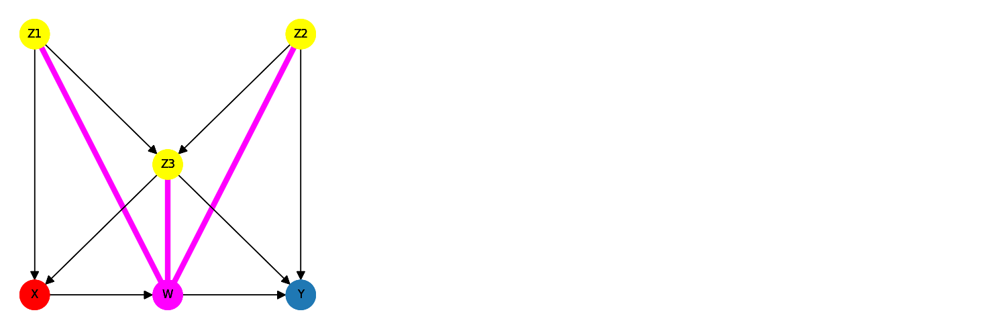

In [16]:
node_of_insterest="W"
node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in dag.parents(node_of_insterest) else "yellow" if node in dag.non_descendants(node_of_insterest) else DARK_BLUE for node in dag.nodes]


paths = dag.edges_to_paths([("Z1", "W"), ("Z2", "W"), ("Z3", "W")])
dag.draw_paths(paths=paths, node_colors=node_colors, cols=3, separate_charts=False)

The bright pink paths between nodes Z1, Z3, Z2 and Y should not exist in the data because they do not exist in the DAG. It therefore follows that if any of these dependencies can be detected in the data then the DAG must be wrong and not only that, we will know exactly where it is wrong! A missing link on the DAG will have been identified rendering the current DAG invalid which can then be corrected by adding the missing link back in.

This is an amazing possibility! Let's start by looking at this expressed as a mathematical formula for node W ...

$$
W \independent _{_{G}} \ Z1, Z2, Z3 \given  X \ \  \Rightarrow \ \ W \independent _{_{D}} \ Z1, Z2, Z3 \given X
$$

It looks scary, but all it is saying is that if W is indepedent of Z1, Z2 and Z3 given X in the graph (DAG) then W should be independent of Z1, Z2 and Z3 given X in the data as well.

As it turns out, it is reletavely easy to run this test and to see if it is true (i.e. does the data matches the DAG or not). Let's have a go ...

To implement the test $W \independent _{_{G}} \ Z1, Z2, Z3 \given  X"$ we can perform a regression on all 4 variables on the left hand side - Z1, Z2, Z3 and X. Some of the text books and sources talk about Z1, Z2 and Z3 "vanishing".

What this means is that if the regression is performed on the parent and non-descendant variables then all the non-descendants should have either a zero co-efficient or one that is close to zero so let's start by visualising the relationships in the data ...

ic| expression: 'W ⫫ Z1, Z2, Z3 | X

'


W ~ Z1 + Z2 + Z3 + X


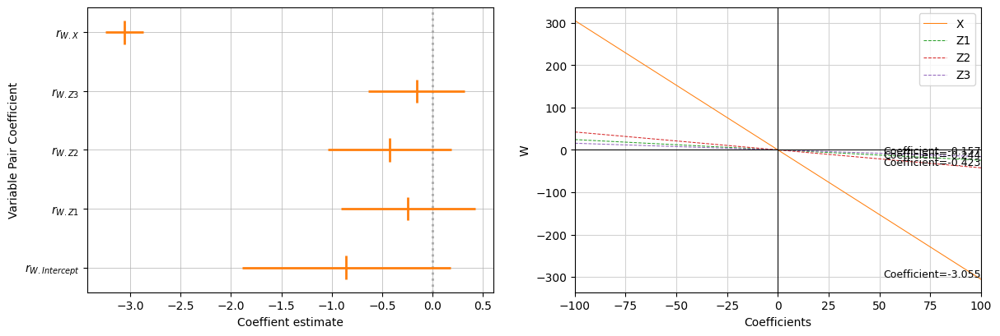

In [17]:
is_independent_of, errors, ols_results = causal_model.data.dependence(expression="W ⫫ Z1, Z2, Z3 | X", show_charts=True)

We can see from this visualisation that Z1, Z2 and Z3 do indeed have a flat (or "vanishing") co-efficient. If we represent the relationships mathematically they look like this .

$$
W = -0.244 \times Z1 -0.423 \times Z2 -0.157 \times Z3 - 3.054 \times X -0.855
$$

This is all looking good so far, so how can we implement this test and extract the results in Python code using an ordinary least squares (OLS) regression and the synthetic dataset from earlier in the article ...

In [18]:
data = causal_model.data

In [19]:
from statsmodels.formula.api import ols

ols_formula = "W ~ Z1 + Z2 + Z3 + X"
ols_results = ols(ols_formula, data).fit()

ols_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      W   R-squared:                       0.945
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     4292.
Date:                Fri, 24 Nov 2023   Prob (F-statistic):               0.00
Time:                        08:03:14   Log-Likelihood:                -3250.5
No. Observations:                1000   AIC:                             6511.
Df Residuals:                     995   BIC:                             6536.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.8552      0.525     -1.628      0.104      -1.886       0.175
Z1            -0.2438      0.339     -0.718      0.473      -0.910       0.422
Z2            -0.4232      0.313     -1.354      0.176      -1.037       0.190
Z3            -0.1574      0.243     -0.647      0.518      -0.635       0.320
X             -3.0549      0.096    -31.942      0.000      -3.243      -2.867
==============================================================================
Omnibus:                        0.469   Durbin-Watson:                   2.026
Prob(Omnibus):                  0.791   Jarque-Bera (JB):                0.370
Skew:                           0.036   Prob(JB):                        0.831
Kurtosis:                       3.061   Cond. No.                         67.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The key aspecrs are the ``coef`` column (co-efficient or slope) and the ``P>|t|`` column (p-value) in the penultimate table of the results summary.

We can easily see that the co-efficients (or slopes in the graph) are small but not zero (i.e. completely flat) for Z1, Z2 and Z3 so how can we reach a conclusion that they are "vanishing"?

As it turns out there is no definition for a "vanishing" co-efficient in any of the texts or articles I have read so I have come up with my own method based on trial-and-error and a lot of testing ...

In [39]:
def test_w():
    CONFIDENCE_LEVEL: float = 0.05 # The confidence level used when checking for statistical significance in model validation
    COEFFICIENT_VALUE: float = 1.0 # The minimum coefficnet below which the relationship is considered to be "vanishing"

    dependent_variable = "W"
    variables = ["Z1", "Z2", "Z3", "X"]

    for variable in variables:
        pvalue = ols_results.pvalues[variable]
        coefficient = ols_results.params[variable]

        if (pvalue > CONFIDENCE_LEVEL) and (abs(coefficient) <= COEFFICIENT_VALUE):
            print(f"{dependent_variable} is not dependent on {variable} in the data")
        else:
            print(f"{dependent_variable} is dependent on {variable} in the data")

test_w()

W is dependent on Z1 in the data
W is not dependent on Z2 in the data
W is not dependent on Z3 in the data
W is dependent on X in the data


The test I have chosen based on many hours of testing is a combination of looking at both the p-value and the co-efficient in the OLS results summary.

In theory the p-value should be enough on its own. For each variable there is a null hypothesis that there is no relationship between the independent variable (say Z1) and the dependent variable (W). 

If the p-value is less than the alpha value (usually 0.05 is chosen) then the null hypothesis is rejected and the conclusion is that there is a relationship.

If we look at the results for variable Z1 we can see that the p-value is 0.473 which is much higher than 0.05 so we cannot reject the null hypothesis and the conclusion is that there is no relationship between Z1 and X. This also holds for Z2 with a p-value of 0.176 and Z3 which has a p-value of 0.518. X however has a p-value of 0.000 so the null hypothesis cannot be rejected and this all matches back to the graph of the slopes above.

So in this case the independence of Z1, Z2 and Z3 from W and the dependence of X on W could all have been established by looking at the p-value in isolation however in my observations from extensive testing this is not always the case and the best results are obtained by defining a "vanishing" co-efficient that indicates independence as follows ...

"For each variable if the p-value is greater than 0.05 and the co-efficient is less than or equal to 1 then that variable is independent (or "vanishing")"

I have found that if the co-efficient checked is performed in addition to the p-value check that the accuracy over a large number of randomly chosen tests increases significantly, hence this is the defintiion I have developed and chosen to implement in Python code to perform the check as accurately as possible.

## Identifying a Missing Causal Link in an Invalid DAG
At this point we have considered a DAG and a dataset knowing that the DAG was an accurate representation of the causal relationships in the data because the author created the dataset to reflect the DAG and not the other way around (which is the way it works in the real world).

A method has been proposd for testing the validity of a DAG against a set of data that involves testing the independence of non-descendants for each node in the DAG and if independence cannot be identified to assume that a link is missing.

That method has been implemented in Python and tested against a case where the DAG matches the data and it has proved that the DAG is valid.

This is just the start though. Testing a matching DAG for validity is one thing but the more important case is - where the DAG is invalid and has missing links that DO exist in the dataset, will this method detect them?

Consider this variation on our DAG ...

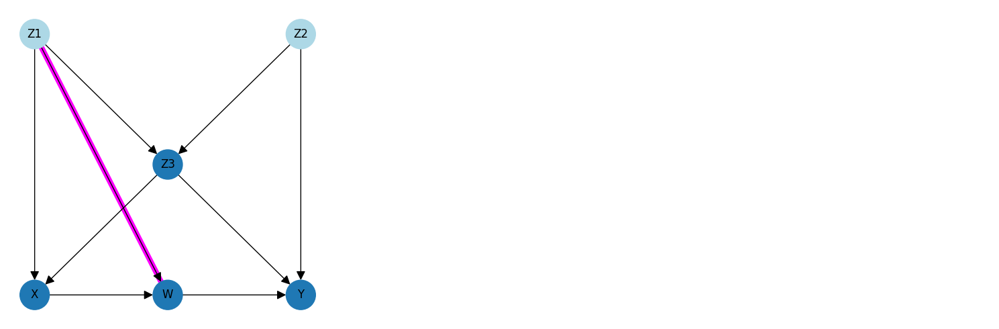

In [30]:
new_edges = [("Z1", "W")]
new_dag = DirectedAcyclicGraph(treatment="X", outcome="Y", edges=dag.edges + new_edges, pos=dag.pos)
new_dag.draw_paths(new_dag.edges_to_paths(new_edges), cols=3)

A new causal link has been added between node Z1 and node W and here is a new synthetic dataset that includes all of the causal relationship including the new one ...

In [31]:
new_causal_model = CausalModel(dag=new_dag)
new_causal_model.fit(X = None)

new_causal_model.data

ic| 'CausalModel.fit'
ic| expr_str: 'Z3 = 2 x Z1 + -1.5 x Z2 + ε'
ic| expr_str: 'X = -3 x Z1 + 2.5 x Z3 + ε'
ic| expr_str: 'W = 1.5 x X + 2 x Z1 + ε'
ic| expr_str: 'Y = 3 x W + 1.5 x Z2 + 2.5 x Z3 + ε'


,Z1,Z2,Z3,X,W,Y
0,7.594026,6.485866,7.532898,-0.500604,10.444249,64.704655
1,7.067126,5.529689,4.769219,-6.935929,5.169497,46.063933
2,7.541211,4.165897,9.121215,0.363288,16.324480,96.425266
3,2.210173,5.219047,-5.063603,-21.127429,-25.444617,-83.455720
4,7.810997,5.448058,7.050100,-4.187002,5.022280,36.733670
...,...,...,...,...,...,...
995,6.800189,3.540091,7.444739,-1.622903,13.456646,52.811415
996,4.145748,4.791960,-0.342144,-7.895847,2.190141,30.764690
997,6.904066,7.363784,3.023159,-8.766950,3.479244,19.870334
998,7.108319,6.047915,6.278557,-3.431348,6.515674,29.470361


In [ ]:
new_causal_model.structural_equations

In this model the structural equations that were used to create the data are as follows ...

$$
Z1 \sim \mathcal{N}(7.45, 1.75^2) \\
Z2 \sim \mathcal{N}(5.15, 1.62^2) \\ 
$$

$$
Z3 = 2 \times Z1 -1.5 \times Z2 + ε \\
X = 3 \times Z1 + 2.5 \times Z3 + ε \\
W = 1.5 \times X + 2 \times Z1 + ε \\
Y = 3 \times W + 1.5 \times Z2 + 2.5 \times Z3 + ε
$$

Now let's assume that our fictitious domain experts were unaware of the causal link between Z1 and W and created this DAG based on their domain knowledge when consulted by the data scientists ...

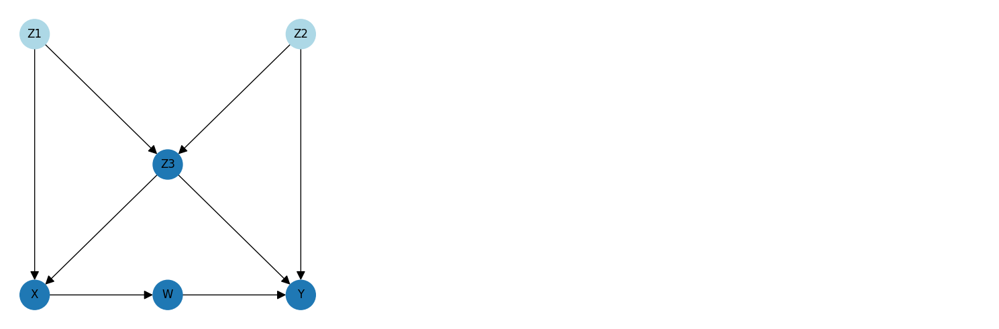

In [36]:
dag.draw(grid_size=3)

At this point the proposed DAG does not match the dataset. The acid test now is to see if our method accurately detects the missing link.

The chart below shows the results of the ordinary least squares regression from implementing the dependence test "W ⫫ Z1, Z2, Z3 | X" ...

ic| expression: 'W ⫫ Z1, Z2, Z3 | X'


W ~ Z1 + Z2 + Z3 + X


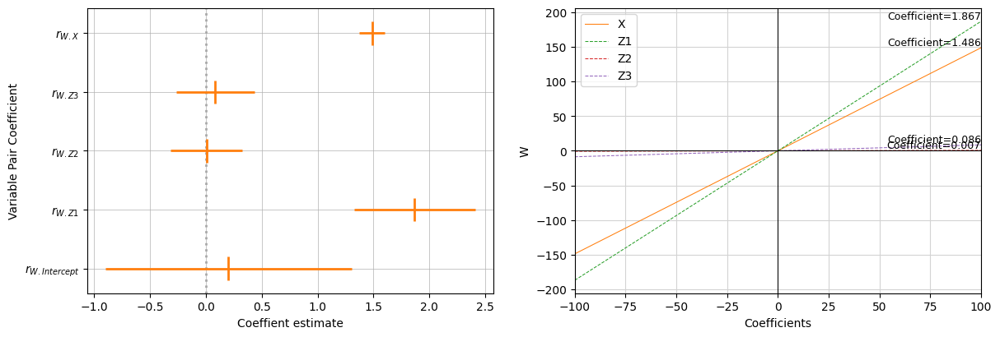

In [38]:
is_independent_of, errors, ols_results = new_causal_model.data.dependence(expression="W ⫫ Z1, Z2, Z3 | X", show_charts=True)

In [40]:
test_w()

W is dependent on Z1 in the data
W is not dependent on Z2 in the data
W is not dependent on Z3 in the data
W is dependent on X in the data


When the causal relationship Z1 -> W exists in the data but not in the DAG it is accurate detected. Hence we know not only that the DAG is invalid but also how to fix it. Simply add ("Z1", "W") to the DAG as an additional edge and it becomes valid.

When I first ran this test successfully I was staggered by the implications. I was no longer depndendent (no pun intended!) on domain experts being infaliible. If their were gaps in their knowledge or if they made some mistakes this validation technique could find causal links they had missed and produce a correct and valid DAG!

At this point we have successfully tested a single node in a valid DAG against a dateset and we have successfully identified a missing link from a node in an invalid DAG.

The next step is to expand our single-node test to identify and execute all validation tests for an entire DAG ...


## From Testing a Single Node to Validating and Entire DAG

We now move from testing node "W" to validating the entire DAG and as it turns out this is very straight-forward. Simply iterate around every node executing this algorithm ...

$$
Node \independent \ non{-}descendants \given parents
$$

For any validation failures add the identified missing link(s) to an overall list of missing links and the end result is an identification of all missing links in the DAG.

Note that if a node has no parents it should still be tested but if a node has no non-descendants it should not and cannot be tested. Hence node Z3 is ommitted from the tests below as it does not have any non-descendents (recalling that parents are excluded from non-descendents).

The collection of validation tests required to test the entire DAG can be represented visually in the diagrams below (in each dag the node being tested is pink, its parents are red, its non-descendants are yellow and all remaining nodes are blue) ...

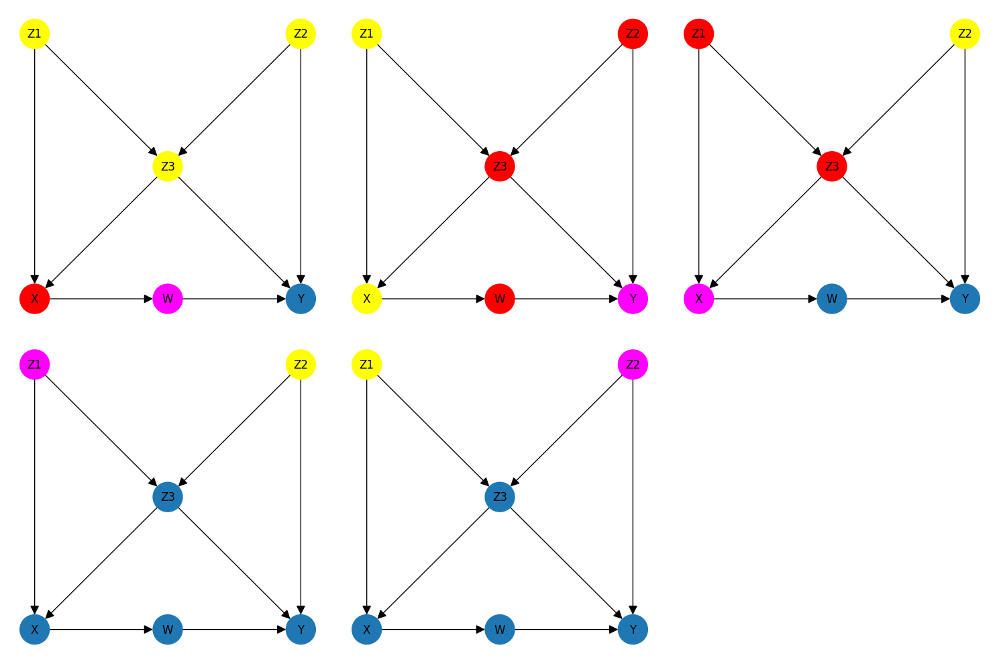

In [67]:
ax_lst = dag._create_grid(item_count=6 , figsize=(5,5), cols=3)

node_list = [node for node in dag.nodes if dag.non_descendants(node) != []]

for i, node_of_insterest in enumerate(node_list):
    node_colors = [BRIGHT_PINK if node in [node_of_insterest] else "red" if node in dag.parents(node_of_insterest) else "yellow" if node in dag.non_descendants(node_of_insterest) else DARK_BLUE for node in dag.nodes]
    dag.draw(node_colors=node_colors, ax=ax_lst[i])

In [60]:
for missing_edge_test in dag.missing_edge_tests(optimize_tests=False).values():
    print(missing_edge_test["expression"])


W ⫫ Z1, Z2, Z3 | X
X ⫫ Z2 | Z1, Z3
Y ⫫ X, Z1 | W, Z2, Z3
Z1 ⫫ Z2
Z2 ⫫ Z1


Here are the tests represented in the equivalent mathematical notation ...

$$
W \independent Z1, Z2, Z3 \given X \\
X \independent Z2 \given Z1, Z3 \\
Y \independent X, Z1 \given W, Z2, Z3 \\
Z1 \independent Z2 \\
Z2 \independent Z1 \\
$$

In [61]:
for missing_edge_test in dag.missing_edge_tests().values():
    print(missing_edge_test["expression"])

W ⫫ Z1, Z2, Z3 | X
X ⫫ Z2 | Z1, Z3
Y ⫫ X, Z1 | W, Z2, Z3
Z1 ⫫ Z2


If these 5 indepedence tests are executed against the data and the non-descendents "vanish" in each test then there is a good level of confidence that the DAG is a valid causal representation of the data and that there are no causal links missing from the DAG.

However, there is one more optimisation and improvement that can be made. The available texts, notably the Pearlean literature - for example "Causal Inference in Statistics" (Pearl, Glymour, Jewell, 2019) - describe a smaller set of tests than those represented above although I have never managed to find an explanation as to how they have been minimised.

Further research and trial-and-error have led to the discovery that some independence tests are equivalent, for example ...

$$
Z1 \independent Z2 \equiv Z2 \independent Z1 \\
and \\
X2 \independent X3 \given X1 \equiv X3 \independent X2 \given X1
$$

This means that in test $A \independent \ B \given P1, P2, ... , Pn$ is equivalent to $B \independent \ A \given P1, P2, ... , Pn$ and one of them can be dropped as there is no point testing for exactly the same thing twice.

It therefore follows that the optimised tests for proving or disproving the validity of our example DAG are as follows ...

$$
W \independent Z1, Z2, Z3 \given X \\
X \independent Z2 \given Z1, Z3 \\
Y \independent X, Z1 \given W, Z2, Z3 \\
Z1 \independent Z2
$$

i.e. Z2 ⫫ Z1 has been removed because it is equivalent to Z1 ⫫ Z2 and tests do not need to be repeated.

Let's finish this section off by taking a look at the graphs that are produced when implementing the OLS regression test for each of our 4 independence statements ...

ic| expression: 'W ⫫ Z1, Z2, Z3 | X'


W ~ Z1 + Z2 + Z3 + X


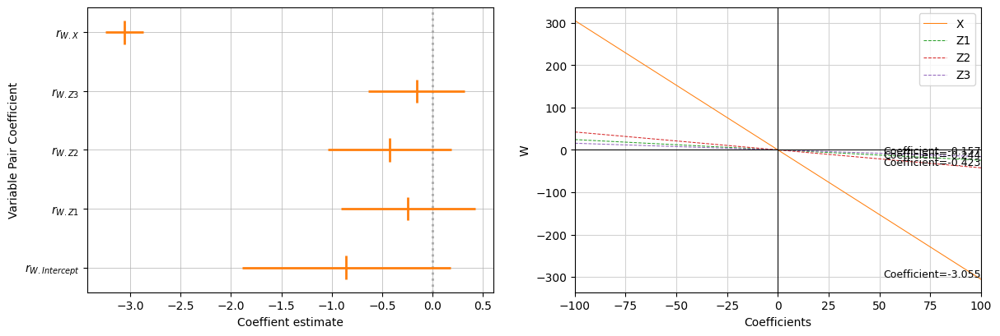

ic| expression: 'X ⫫ Z2 | Z1, Z3'


X ~ Z2 + Z1 + Z3


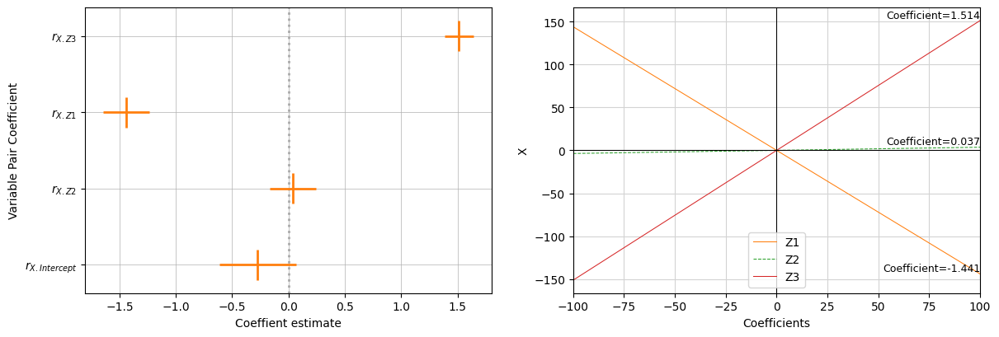

ic| expression: 'Y ⫫ X, Z1 | W, Z2, Z3'


Y ~ X + Z1 + W + Z2 + Z3


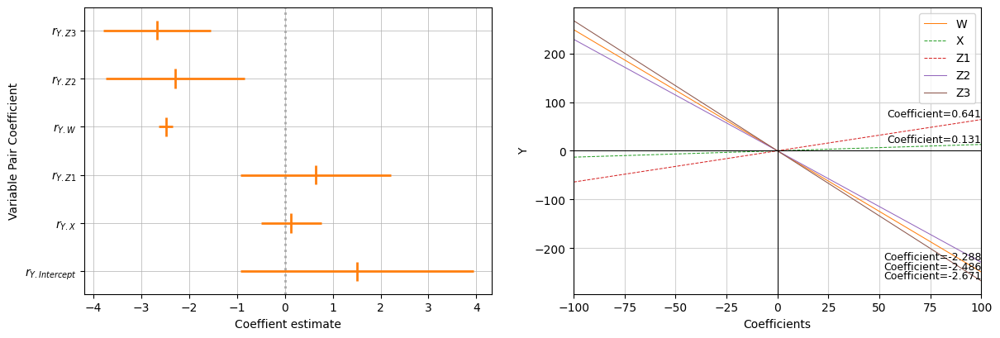

ic| expression: 'Z1 ⫫ Z2'


Z1 ~ Z2


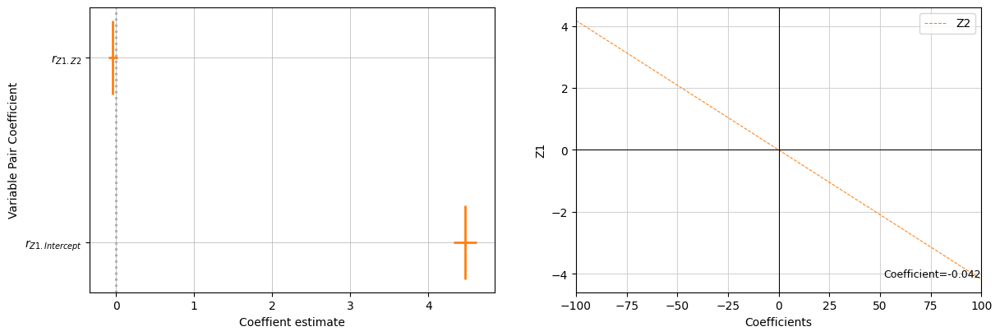

In [73]:
for i, missing_edge_test in enumerate(dag.missing_edge_tests().values()):
    causal_model.data.dependence(expression=missing_edge_test["expression"], show_charts=True)
    plt.show()

This result is exactly what we were hoping for. For each node being tested the graph shows that the co-efficients for the non-descendents are very small i.e. they are vanishing i.e. they are independent i.e. there are no missing links.

The obvious next question to ask is "just how reliable is this technique and can it always be relied on to identify missing causal links and correct an invalid DAG?"

This is a very important question to ask and answer, made doubly so becuase none of the literature (books, blogs and articles etc.) that I have read addresses this critical question. Where causal validation is explored at all it tends to be incomplete, poorly explained and with too much statistical jargon and not enough Python code, but crucially I have only ever found examples where the DAG and the data match with no exploration of what happens when they do not.

The following sections develop this thought beyond anything I have ever found in the literature using approaches that I have conceived of and experimented with in Python code to see how these algorithms perform in life-like scenarios ...

## Testing to Destruction

To test the algorithm proposed in this article to destruction, the following approach was taken ...

1. Identify every edge (causal relationship) in the dag
2. Run 100 tests as follows ...
    - Generate a valid set of test data for the DAG.
    - Pick one of the missing edges at random and delete it.
    - See if the proposed algorithm correctly identifies the missing edge.

In evaluating success two factors were considered ...

1. Did the proposed algorithm find the deleted / missing edge(s) exactly?
2. Did the algorithm find the deleted / missing edges but in addition to that identify addition missing edges in error?

The results were as follows ...

In [42]:
from itertools import combinations
import random


def run_missing_edge_tests(dag: DirectedAcyclicGraph, n_missing_edges: int = 1, n_tests: int = 100, n_cols: int = 4, draw : bool = True, print_edges: bool = False):
    ic.disable()

    edge_sets_to_remove = [list(edges_list) for edges_list in combinations(dag.edges, n_missing_edges)]
    path_sets_to_remove = [dag.edges_to_paths(list(edges_list)) for edges_list in edge_sets_to_remove]

    if draw:
        dag.draw_paths(paths=path_sets_to_remove, cols=n_cols)
        plt.show()

    n_tests_passed = 0
    n_missing_edges_found = 0

    for _ in range(0, n_tests):
        # Generate a new DAG that removes a set of edges from the original DAG

        while True: # Avoids the condition where the selected edges remove all links to the treatment or the outcome which would cause the DAG to break down
            edges_to_remove = random.choice(edge_sets_to_remove)
            new_dag = dag.remove_edges(edges_to_remove=edges_to_remove)
            if new_dag.is_valid: break
        
        # Generate a set of data that matches the original DAG
        causal_model = CausalModel(dag=dag, random_state=42)
        causal_model.fit(X = None)
        data = causal_model.data

        # Instantiate a causal model from the DAG with the missing edges but fit it to the causal model that had data generated when all the edges were present
        causal_model = CausalModel(dag=new_dag)
        causal_model.fit(X = data)

        # Use the _validate_missing_edges method to see if the causal model can correctly identify the edges that are missing in the DAG
        _, missing_edges = causal_model._validate_missing_edges()

        # Ascertain if the test passed, partially passed or failed
        n_tests_passed += 1 if sorted(edges_to_remove) == sorted(missing_edges) else 0 # If the missing edges identified exactly match those that were remove the test passed fully
        n_missing_edges_found += 1 if all(elem in missing_edges for elem in edges_to_remove) else 0 # If missing edges were found, but other edges were also considered to be missing, the test passed partially

        if print_edges:
            print(all(elem in missing_edges for elem in edges_to_remove))
            print(edges_to_remove)
            print(missing_edges)
            print("\n")

    print(f"pass rate: {n_tests_passed / n_tests:.1%}")
    print(f"missing edges identification rate: {n_missing_edges_found / n_tests:.1%}")

    ic.enable()

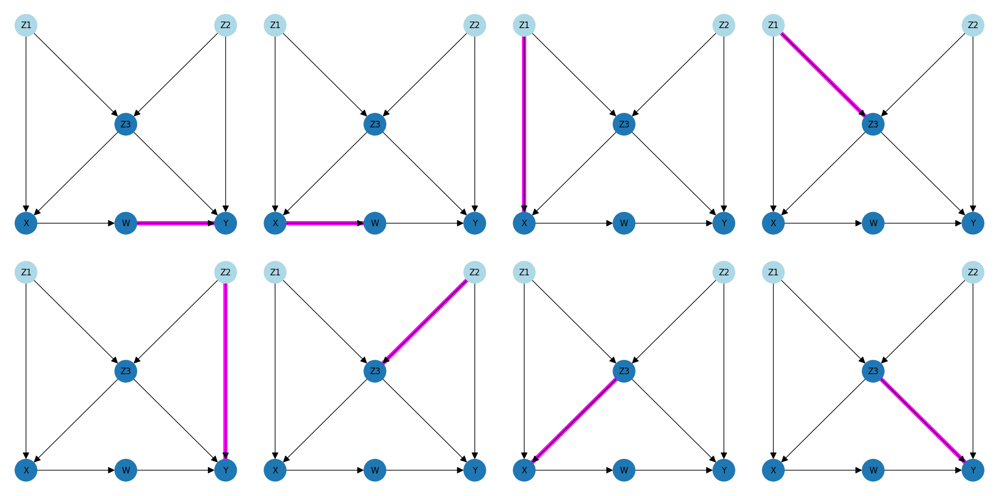

pass rate: 88.0%
missing edges identification rate: 100.0%


In [43]:
run_missing_edge_tests(dag=dag)

The missing edge was correctly identified in 100/100 tests but in 12 of those tests the algorithm also identified some other edge(s) that were in fact not missing.

The next obvious question is "what if two edges / causal links are missing?" ...

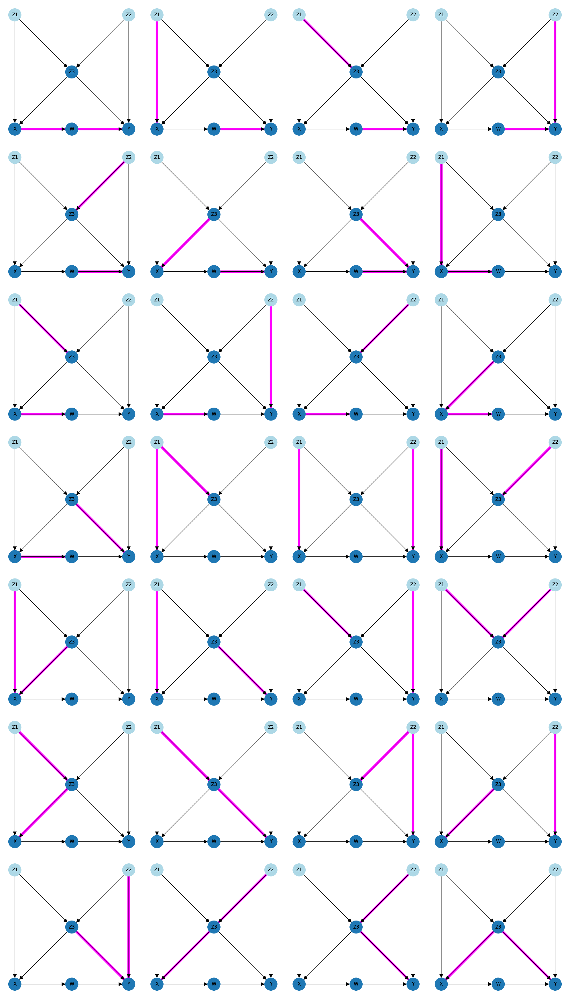

pass rate: 57.0%
missing edges identification rate: 70.0%


In [44]:
run_missing_edge_tests(dag=dag, n_missing_edges=2)

The accuracy drops when two edges are deleted. The algorithm correctly found the two missing edges in 70/100 of tests but in 13 of those it over-identified and found some edges it thought were missing which in fact were not.

Further tests was carried out to evaluate the algorithm performance for a much more complicated, life-like DAG ...

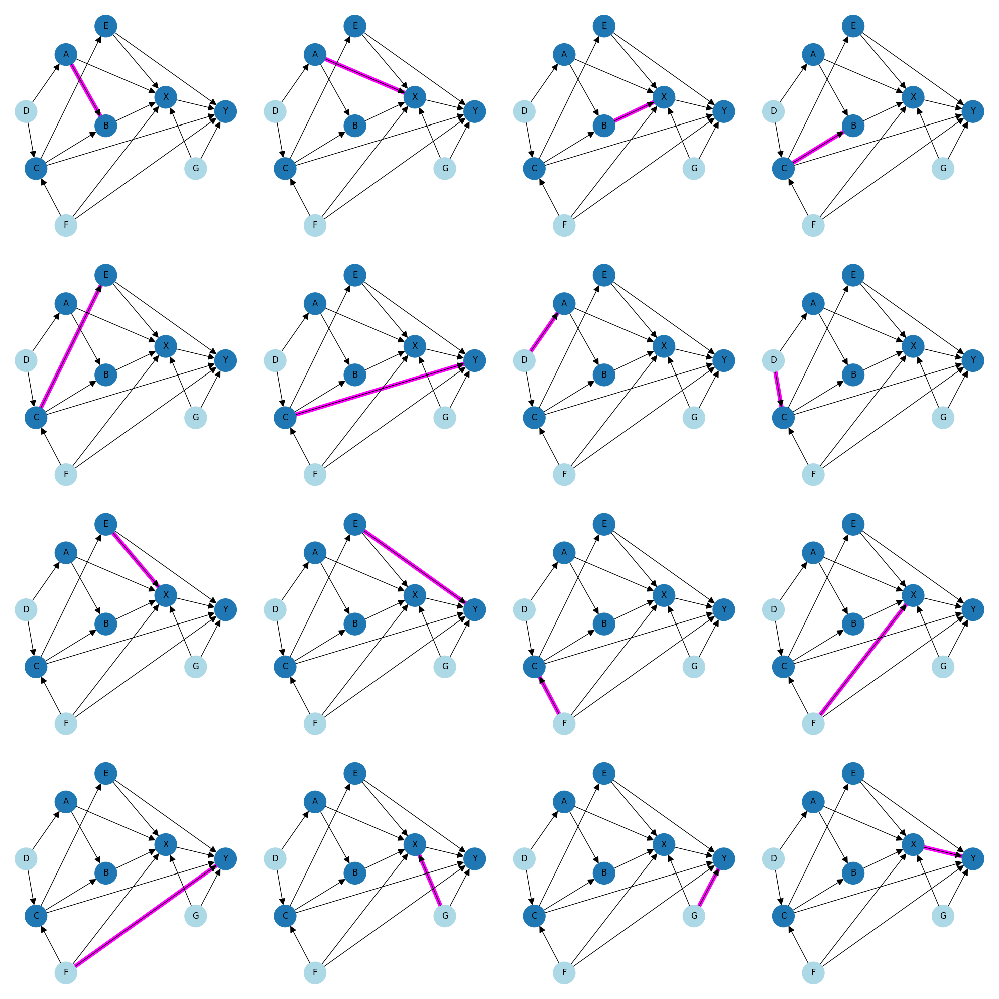

pass rate: 61.0%
missing edges identification rate: 76.0%


In [47]:
complex_dag = DirectedAcyclicGraph.example_dags()["book_of_why_smoking_asthma_2"]["dag"]
run_missing_edge_tests(dag=complex_dag, n_missing_edges=1, n_tests=100, n_cols=4, draw=True)

In this case the algorithm correctly identified the missing causal link in 76/100 tests including 15 tests where additional links were identified as missing that actually were not.

Lastly, let's evaluate the complex DAG with 2 valid links taken out ...

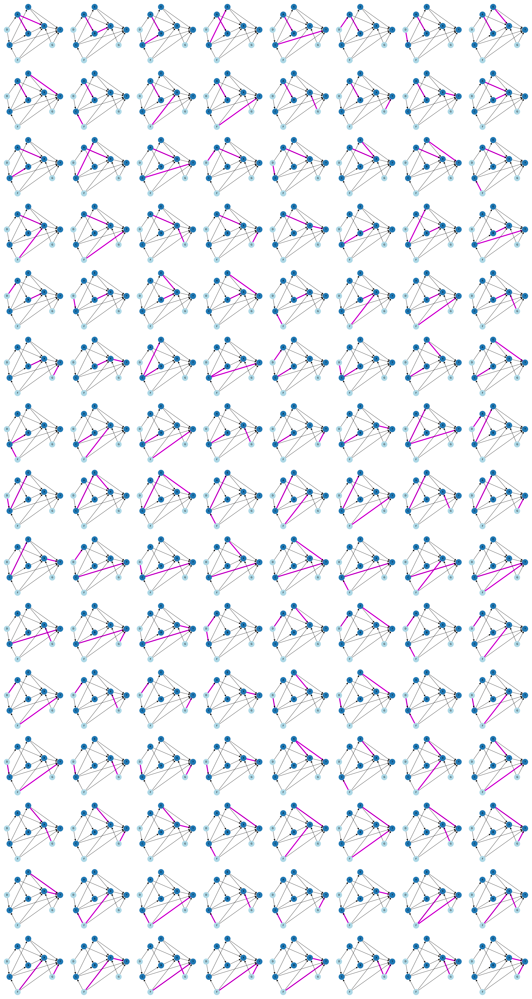

pass rate: 25.0%
missing edges identification rate: 44.0%


In [49]:
complex_dag = DirectedAcyclicGraph.example_dags()["book_of_why_smoking_asthma_2"]["dag"]
run_missing_edge_tests(dag=complex_dag, n_missing_edges=2, n_tests=100, n_cols=8, draw=True)

This time the accuracy started to slip. The algorithm correctly identified the missing causal links in 44/100 tests but the 44 included 19 where the algorithm incorrectly identified additional links that it thought were missing.

## Bonus Section: Optimising Missing Links
You may have been wondering why the test results have included the number of tests where the identified missing links matched exactly with another figure quoted for the tests that over-identified i.e. the deleted link(s) were found but so were some others that were incorrectly identified.

The reason is that in the case of over-identification the links identified as missing that were not actually missing can be easily fixed.

In a recent article I explored the mirror image of the validation explained here which is where dependence is used to identify spurious links (as opposed to using independence to identify missing links).

https://towardsdatascience.com/demystifying-dependence-and-why-it-is-important-in-causal-inference-and-causal-validation-4263b18d5f04

The "spurious links" algorithm is amazingly accurate and identifies nearly all spurious correctly, even where there are 2 or more and even in a complex DAG.

That means that an algorithm finds a missing link(s) but also over-identifying some that are not actually missing can be optimised and improved as follows ...

1. Run the dependence / spurious link algorithm to identify and correct any genuine <b>spurious links</b>.
2. Run the independence / missing link algorithm proposed in this article to identify and correct any <b>missing links</b>.
3. As step 2 may have over-identified, re-run the dependence / spurious link algorithm which will find and remove any links step 2 thought were missing but actually were not.

If this advanced algorithm were implemented it would increase the accuracy to the higher of the two numbers quoted for each test in the sections above, i.e. ...

- 1 missing link in a simple DAG: 100% accuracy
- 2 missing links in a simple DAG: 70% accuracy
- 1 missing link in a complex DAG: 76% accuracy
- 2 missing links in a complex DAG: 44% accuracy

Whilst these results are not perfect, they are certainly good enough to be useful. It should also be noted that the algorithm proposed in this article has close to 100% accuracy when the DAG actually matches the data so in the case og a  valiadation failure the DAG can still be modified through brute-force trial-and-error until the validation checks pass.

These are complex techniques which will be fully explored in future articles but the theory is sound and it offers the tantalising potential to produce highly efficient algorithms for implementing causal validation.

# Conclusion

Causal inference offers the promise of a new set of techniques to extend the organisational impact and outcomes offered by established machine learning techniques. However, in order to start that causal journey the Directed Acyclic Graph (DAG) that captures the causal relationships must be constructed using domain expertise which can contain mistakes and biases or which can be incomplete.

Unless the DAG accurately captures the causal relationships any subsequent analysis will be inaccurate and ineffective but "Causal Validation" offers the potential to correct and fix inaccurate DAGs to ensure the conclusions of causal inference approaches are correct.

A previous article explored how to use dependence to identify and remove spurious causal links from the DAG whilst this article explored how to use independence to identify and add missing causal links.

Future articles will explore how to use v-structures to identify and correct reversed causal links (where the causal arrow is in the wrong direction) and also how to combine spurious, missing and reversed link tests into a coherent whole that offers the promise of highly effective causal validation algorithms leading to improved organisational impact and outcomes arising from the optimal application of causal inference techniques.